# MSDS 7331 - Lab 3 - Airline Satisfaction Dataset
***
Team - Triston Hudgins, Shijo Joseph, Douglas Yip

#### The dataset chosen is a compilation of airline customer satisfaction surveys.  The goal is to select from one of features (Association Rule Mining, Clustering, or Collaborative Filtering) to build a classifier and analyze its performance in terms of accuracy (precision, recall) and speed) to help us understand the customer sastification. 

Source: https://www.kaggle.com/datasets/teejmahal20/airline-passenger-satisfaction?resource=download&select=test.csv

In [1]:
## Setup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore', DeprecationWarning)
%matplotlib inline
import seaborn as sns
import plotly.express as px
import scipy.stats as stats

# Import Cluster Analysis libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn import metrics
import scipy.cluster.hierarchy as sch

#import visualization libraries
from matplotlib.pyplot import scatter
import plotly
from plotly.graph_objs import Scatter, Marker, Layout, layout,XAxis, YAxis, Bar, Line
%matplotlib inline

# get ANOVA table as R like output
import statsmodels.api as sm
from statsmodels.formula.api import ols

***
### Data Understanding (20 points total)
### [10 points] Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file. Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes? How do you deal with these problems?

In [2]:
# load the airline satisfaction  dataset

df = pd.read_csv('https://raw.githubusercontent.com/dk28yip/MSDS7331/main/airline.csv') # read in the csv file
df.head()

#reduced samples set from 100,000 to 30,000 as a few of us had computer performance issues
df = df.sample(n=30000)

#### Check for NAs


In [3]:
# Any missing values in the dataset
def plot_missingness(df: pd.DataFrame=df) -> None:
    nan_df = pd.DataFrame(df.isna().sum()).reset_index()
    nan_df.columns  = ['Column', 'NaN_Count']
    nan_df['NaN_Count'] = nan_df['NaN_Count'].astype('int')
    nan_df['NaN_%'] = round(nan_df['NaN_Count']/df.shape[0] * 100,4)
    nan_df['Type']  = 'Missingness'
    nan_df.sort_values('NaN_%', inplace=True)

    # Add completeness
    for i in range(nan_df.shape[0]):
        complete_df = pd.DataFrame([nan_df.loc[i,'Column'],df.shape[0] - nan_df.loc[i,'NaN_Count'],100 - nan_df.loc[i,'NaN_%'], 'Completeness']).T
        complete_df.columns  = ['Column','NaN_Count','NaN_%','Type']
        complete_df['NaN_%'] = complete_df['NaN_%'].astype('int')
        complete_df['NaN_Count'] = complete_df['NaN_Count'].astype('int')
        nan_df = pd.concat([nan_df,complete_df], sort=True)
            
    nan_df = nan_df.rename(columns={"Column": "Feature", "NaN_%": "Missing %"})

    # Missingness Plot
    fig = px.bar(nan_df,
                 x='Feature',
                 y='Missing %',
                 title=f"Missingness Plot (N={df.shape[0]})",
                 color='Type',
                 opacity = 0.6,
                 color_discrete_sequence=['red','#808080'],
                 width=800,
                 height=800)
    fig.show()

plot_missingness(df)

print("Missing 99 values if the 'Arrival Delay in Minutes'column; approximately 0.31%.")

Missing 99 values if the 'Arrival Delay in Minutes'column; approximately 0.31%.


#### Remove unwanted columns
ID was removed from the dataset as it was used as a unique identified for each passenger

In [4]:
df["GenderNumeric"] = (df["Gender"]=="Male").astype(int)
df["CustomerTypeNumeric"] = (df["Customer Type"]=="Loyal Customer").astype(int)
df["TypeofTravelNumeric"] = (df["Type of Travel"]=="Personal Travel").astype(int)
df["ClassNumeric"] = df["Class"]
df["ClassNumeric"].replace(['Eco', 'Eco Plus', 'Business'], [0, 1, 2], inplace=True)

df["Arrival Delay in Minutes"]= df["Arrival Delay in Minutes"].fillna(0)


dfclean = df.drop(columns=['id'])

dfclean.isnull().sum() #double check on the missing values - 'arrival delay in minutes =310'

Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
GenderNumeric                        0
CustomerTypeNumeric                  0
TypeofTravelNumeric      

In [5]:
#Fill in missing values
dfclean["Arrival Delay in Minutes"].fillna(dfclean["Arrival Delay in Minutes"].median(), inplace=True)

In [6]:
dfclean.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,30000.0,39.515967,15.122228,7.0,27.0,40.0,51.0,85.0
Flight Distance,30000.0,1186.804667,993.989849,31.0,414.0,842.0,1736.0,4983.0
Inflight wifi service,30000.0,2.726100,1.326752,0.0,2.0,3.0,4.0,5.0
Departure/Arrival time convenient,30000.0,3.051233,1.519019,0.0,2.0,3.0,4.0,5.0
Ease of Online booking,30000.0,2.746100,1.394883,0.0,2.0,3.0,4.0,5.0
Gate location,30000.0,2.970100,1.271427,1.0,2.0,3.0,4.0,5.0
Food and drink,30000.0,3.209633,1.326504,0.0,2.0,3.0,4.0,5.0
Online boarding,30000.0,3.255333,1.346501,0.0,2.0,3.0,4.0,5.0
Seat comfort,30000.0,3.454267,1.313151,1.0,2.0,4.0,5.0,5.0
Inflight entertainment,30000.0,3.365533,1.329603,0.0,2.0,4.0,4.0,5.0


In [7]:
dfclean.corr()

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,...,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,GenderNumeric,CustomerTypeNumeric,TypeofTravelNumeric,ClassNumeric
Age,1.000000,0.096451,0.015388,0.039843,0.025005,0.006711,0.021547,0.214295,0.155928,0.072068,...,-0.045919,0.034317,-0.048157,0.049970,-0.006105,-0.007386,0.006715,0.287447,-0.043220,0.141935
Flight Distance,0.096451,1.000000,0.001312,-0.023921,0.066152,0.004331,0.060311,0.215949,0.155690,0.127930,...,0.064808,0.070745,0.065808,0.088127,-0.005948,-0.007943,0.009034,0.222289,-0.270200,0.452369
Inflight wifi service,0.015388,0.001312,1.000000,0.343192,0.711132,0.336538,0.134300,0.455980,0.126484,0.208024,...,0.123907,0.050263,0.112115,0.134304,-0.018036,-0.019276,0.008888,0.005314,-0.102569,0.031946
Departure/Arrival time convenient,0.039843,-0.023921,0.343192,1.000000,0.435537,0.438608,0.007127,0.067563,0.009656,-0.006203,...,0.071950,0.089183,0.069322,0.012123,-0.002439,-0.003369,0.008171,0.201387,0.259312,-0.095223
Ease of Online booking,0.025005,0.066152,0.711132,0.435537,1.000000,0.457498,0.032352,0.406763,0.031359,0.045334,...,0.043637,0.012685,0.033937,0.018471,-0.005250,-0.006970,0.007017,0.016490,-0.132850,0.105494
Gate location,0.006711,0.004331,0.336538,0.438608,0.457498,1.000000,0.002076,0.001169,0.008435,0.004572,...,0.001080,-0.041157,-0.002165,-0.002448,0.005107,0.005887,-0.004452,-0.001161,-0.021682,-0.001473
Food and drink,0.021547,0.060311,0.134300,0.007127,0.032352,0.002076,1.000000,0.231741,0.569687,0.617940,...,0.036988,0.084118,0.034681,0.659401,-0.030686,-0.033437,0.005191,0.061852,-0.056538,0.078356
Online boarding,0.214295,0.215949,0.455980,0.067563,0.406763,0.001169,0.231741,1.000000,0.421607,0.278490,...,0.085086,0.206564,0.071152,0.329331,-0.015524,-0.018080,-0.042583,0.192473,-0.225565,0.324390
Seat comfort,0.155928,0.155690,0.126484,0.009656,0.031359,0.008435,0.569687,0.421607,1.000000,0.604145,...,0.073719,0.192997,0.069325,0.674647,-0.029862,-0.031433,-0.023448,0.166246,-0.113999,0.223814
Inflight entertainment,0.072068,0.127930,0.208024,-0.006203,0.045334,0.004572,0.617940,0.278490,0.604145,1.000000,...,0.382791,0.113720,0.407358,0.683808,-0.026196,-0.031407,0.006834,0.112108,-0.143141,0.191446


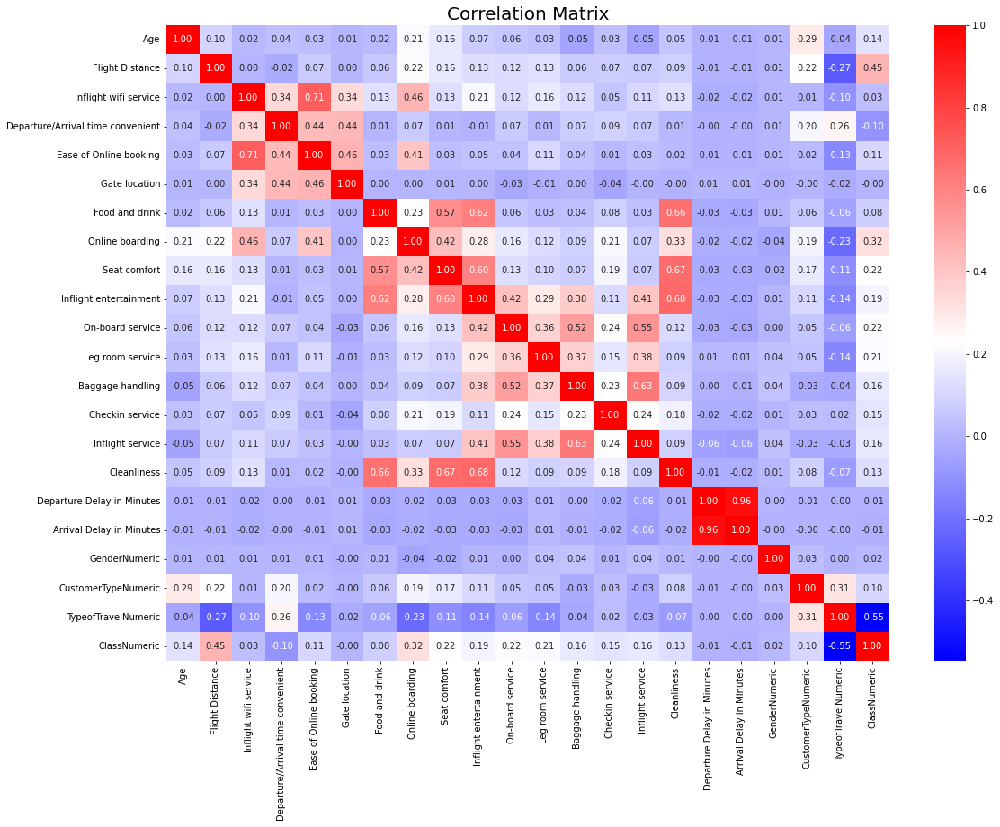

In [8]:
f, ax = plt.subplots(figsize=[18, 13])
sns.heatmap(dfclean.corr(), annot=True, fmt=".2f", ax=ax, cmap="bwr")
ax.set_title("Correlation Matrix", fontsize=20)
plt.show()

Very strong correlations (values from 0.8 to 1 or -0.8 to -1.0)
Strong correlations (values from 0.6 to 0.8 or -0.6 to -0.8)
Moderate correlations (values from 0.4 to 0.6 or -0.4 to -0.6) 

#### Check distribution of the data

C:\Datascience\Anaconda3\envs\ML7331\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



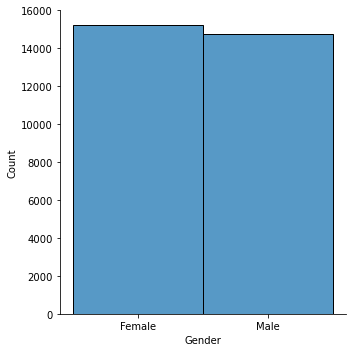

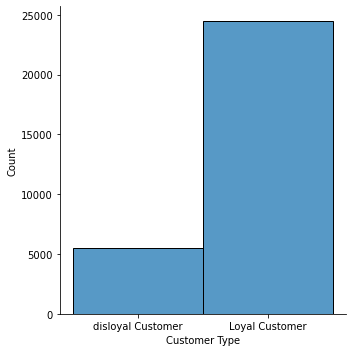

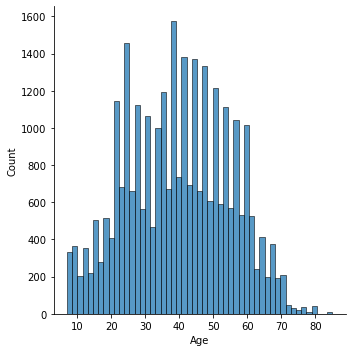

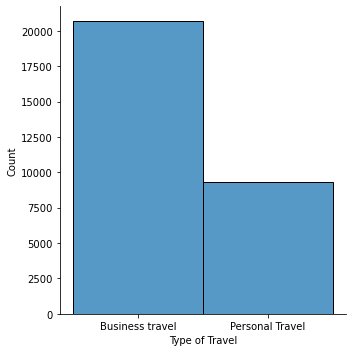

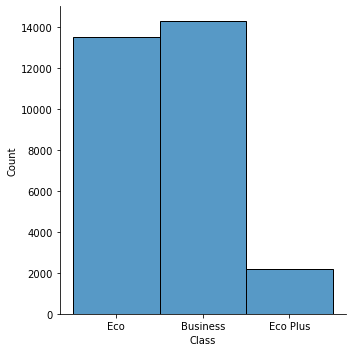

...

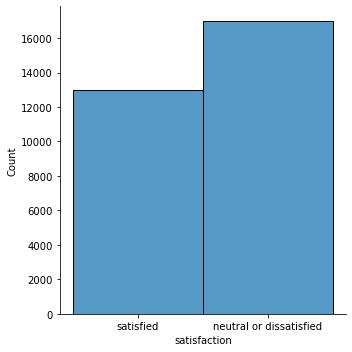

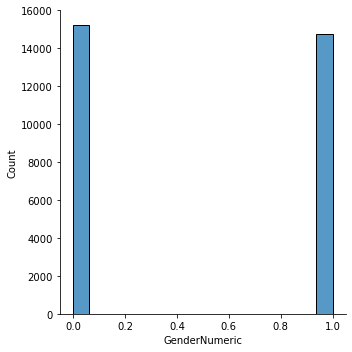

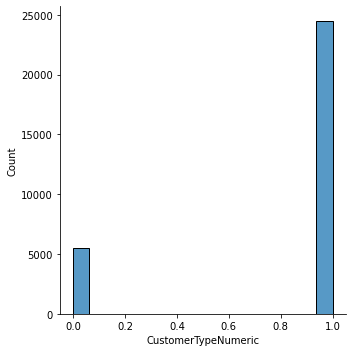

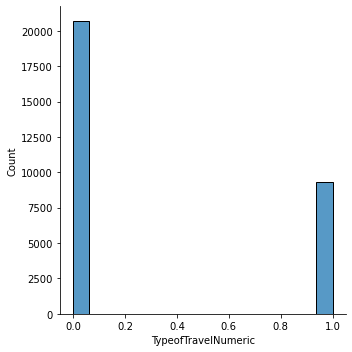

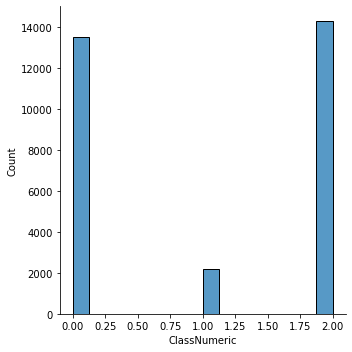

In [9]:
##distribution of the data

for column in dfclean:
    
    sns.displot(x=column, data=dfclean)

In [10]:
print (dfclean.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 67025 to 59701
Data columns (total 27 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Gender                             30000 non-null  object 
 1   Customer Type                      30000 non-null  object 
 2   Age                                30000 non-null  int64  
 3   Type of Travel                     30000 non-null  object 
 4   Class                              30000 non-null  object 
 5   Flight Distance                    30000 non-null  int64  
 6   Inflight wifi service              30000 non-null  int64  
 7   Departure/Arrival time convenient  30000 non-null  int64  
 8   Ease of Online booking             30000 non-null  int64  
 9   Gate location                      30000 non-null  int64  
 10  Food and drink                     30000 non-null  int64  
 11  Online boarding                    30000 non-null 

#### Summary of values to be used in classification modeling
A total of +100,000 passenger results are recorded in this data set.
We have a combination of categorical, ordinal and continous variable in this dataset.

- __Gender:__- Gender of the passengers (Female, Male) - Categorical Variable
- __Customer Type:__- The customer type (Loyal customer, disloyal customer) - Categorical Variable
- __Age:__- The actual age of the passengers - Continous Variable
- __Type of Travel:__- Purpose of the flight of the passengers (Personal Travel, Business Travel) - Categorical Variable
- __Class:__- Travel class in the plane of the passengers (Business, Eco, Eco Plus) - Categorical Variable
- __Flight distance:__- The flight distance of this journey - Continous Variable
- __Inflight wifi service:__- Satisfaction level of the inflight wifi service (0:Not Applicable;1-5) - Categorical Variable
- __Departure/Arrival time convenient:__- Satisfaction level of Departure/Arrival time convenient - Categorical Variable
- __Ease of Online booking:__- Satisfaction level of online booking - Categorical Variable
- __Gate location:__- Satisfaction level of Gate location - Categorical Variable
- __Food and drink:__- Satisfaction level of Food and drink - Categorical Variable
- __Online boarding:__- Satisfaction level of online boarding - Categorical Variable
- __Seat comfort:__- Satisfaction level of Seat comfort - Categorical Variable
- __Inflight entertainment:__- Satisfaction level of inflight entertainment - Categorical Variable
- __On-board service:__- Satisfaction level of On-board service - Categorical Variable
- __Leg room service:__- Satisfaction level of Leg room service - Categorical Variable
- __Baggage handling:__- Satisfaction level of baggage handling - Categorical Variable
- __Check-in service:__- Satisfaction level of Check-in service - Categorical Variable
- __Inflight service:__- Satisfaction level of inflight service - Categorical Variable
- __Cleanliness:__- Satisfaction level of Cleanliness - Categorical Variable
- __Departure Delay in Minutes:__- Minutes delayed when departure - Continous Variable
- __Arrival Delay in Minutes:__- Minutes delayed when Arrival - Continous Variable
- __Satisfaction:__- Airline satisfaction level(Satisfaction, neutral or dissatisfaction) - Categorical Variable

*** 
### [10 points] Visualize the any important attributes appropriately. Important: Provide an interpretation for any charts or graphs.

In [11]:
 #Sum Survey Score Columns - index(6:19)
dfclean['Survey_Total']=dfclean.iloc[:,6:19].sum(axis=1)

#Add Age Groups
dfclean['Age_Group'] = pd.cut(dfclean['Age'], bins = [0,17,35,65,90], labels=["Adolescent", "Young Adult", "Middle Age", "Senior"], right=True)
dfclean['Age_Group_Numeric'] = pd.cut(dfclean['Age'], bins = [0,17,35,65,90], labels=["1", "2", "3", "4"], right=True)

#Add Distance Groups
dfclean['Distance_Group'] = pd.cut(dfclean['Flight Distance'], bins = [0,500,1000,2500,5000], labels=["Short", "Moderate", "Long", "Extra Long"], right=True)
dfclean['Distance_Group_Numeric'] = pd.cut(dfclean['Flight Distance'], bins = [0,500,1000,2500,5000], labels=["1", "2", "3", "4"], right=True)

#Add Departure Delay Groups
dfclean['Departure_Delay_Group'] = pd.cut(dfclean['Departure Delay in Minutes'], bins = [-1,1,100,1600], labels=["None","Minimal","Long"], right=True)
dfclean['Departure_Delay_Group_Numeric'] = pd.cut(dfclean['Departure Delay in Minutes'], bins = [-1,1,100,1600], labels=["0","1","2"], right=True)

#Change Satisfaction to 1 or 0
dfclean['satisfaction'].replace('neutral or dissatisfied', 0,inplace=True)
dfclean['satisfaction'].replace('satisfied', 1,inplace=True)


dfclean.head(n=50)

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,CustomerTypeNumeric,TypeofTravelNumeric,ClassNumeric,Survey_Total,Age_Group,Age_Group_Numeric,Distance_Group,Distance_Group_Numeric,Departure_Delay_Group,Departure_Delay_Group_Numeric
67025,Female,disloyal Customer,21,Business travel,Eco,2106,4,4,4,2,...,0,0,0,53,Young Adult,2,Long,3,Minimal,1
93889,Female,Loyal Customer,52,Personal Travel,Business,817,1,1,2,4,...,1,1,2,37,Middle Age,3,Moderate,2,None,0
90804,Male,Loyal Customer,57,Business travel,Business,130,5,5,5,5,...,1,0,2,58,Middle Age,3,Short,1,Minimal,1
25175,Male,Loyal Customer,23,Business travel,Eco,337,5,2,2,2,...,1,0,0,40,Young Adult,2,Short,1,None,0
89959,Male,Loyal Customer,39,Business travel,Business,919,5,5,5,5,...,1,0,2,48,Middle Age,3,Moderate,2,Minimal,1
45191,Female,disloyal Customer,36,Business travel,Eco,1031,2,2,2,3,...,0,0,0,35,Middle Age,3,Long,3,Minimal,1
26998,Male,Loyal Customer,37,Business travel,Business,347,2,2,2,2,...,1,0,2,28,Middle Age,3,Short,1,None,0
51704,Female,Loyal Customer,62,Personal Travel,Eco Plus,2556,3,5,2,3,...,1,1,1,44,Middle Age,3,Extra Long,4,None,0
79660,Female,Loyal Customer,24,Business travel,Business,820,1,5,4,4,...,1,0,2,28,Young Adult,2,Moderate,2,None,0
94655,Male,Loyal Customer,45,Business travel,Eco,451,1,4,4,4,...,1,0,0,29,Middle Age,3,Short,1,Minimal,1


In [12]:
#Plotly Histogram - Age
px.histogram(dfclean['Age'], x= "Age",
             title = 'Age Distribution',
             )

In [13]:
#Plotly Histogram - Flight Distance
px.histogram(dfclean['Flight Distance'], x= "Flight Distance",
             title = 'Flight Distance Distribution',
             )

In [14]:
#Plotly Histogram - Departure Delay in Minutes
px.histogram(dfclean['Departure Delay in Minutes'], x= "Departure Delay in Minutes",
             title = 'Departure Delay Distribution',
             nbins = 50,
             )

In [15]:
#Plotly Histogram - Arrival Delay in Minutes
px.histogram(dfclean['Arrival Delay in Minutes'], x= "Arrival Delay in Minutes",
             title = 'Arrival Delay Distribution',
             nbins = 50,
             )

In [16]:
px.box(dfclean,
       x="Class", y="Age", 
       color="Class",
       title = "Box Plot of Age by Class")

In [17]:
#ANOVA of class to age
# Ordinary Least Squares (OLS) model
model = ols('Age ~ C(Class)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Class),1.387808e+05,2.0,309.681099,7.531031e-134
Residual,6.721444e+06,29997.0,NaN,NaN


The ANOVA between age and class shows overwhelming evidence that there is a difference between the mean age of travelers among the various classes.

In [18]:
px.box(dfclean,
       x="Class", y="Survey_Total", 
       color="Class",
       title = "Box Plot of Survey Total by Class")

In [19]:
#ANOVA of Class to Total Survey Score
# Ordinary Least Squares (OLS) model
model = ols('Survey_Total ~ C(Class)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Class),1.638551e+05,2.0,1210.959452,0.0
Residual,2.029449e+06,29997.0,NaN,NaN


The ANOVA between class and survey score shows overwhelming evidence that there is a difference between the mean survey score among the classes.

In [65]:
px.box(dfclean,
       x="Distance_Group", y="Survey_Total", 
       color="Distance_Group",
       title = "Box Plot of Distance Traveled by Survey Total")

In [21]:
#ANOVA of age to Total Survey Score
# Ordinary Least Squares (OLS) model
model = ols('Survey_Total ~ C(Distance_Group)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Distance_Group),5.182658e+04,3.0,241.980916,3.703554e-155
Residual,2.141477e+06,29996.0,NaN,NaN


The ANOVA between distance group and survey score shows overwhelming evidence that there is a difference between the mean survey score among the distance groups.

In [22]:
#ANOVA of class to Total Survey Score
# Ordinary Least Squares (OLS) model
model = ols('Survey_Total ~ C(Age)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Age),6.862903e+04,74.0,13.062243,1.096496e-152
Residual,2.124675e+06,29925.0,NaN,NaN


In [23]:
px.box(dfclean,
       x="Departure_Delay_Group", y="Survey_Total", 
       color="Departure_Delay_Group",
       title = "Box Plot of Total by Departure Delay Group")

In [24]:
#ANOVA of age to Total Survey Score
# Ordinary Least Squares (OLS) model
model = ols('Survey_Total ~ C(Departure_Delay_Group)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Departure_Delay_Group),2.141020e+03,2.0,14.655273,4.349141e-07
Residual,2.191163e+06,29997.0,NaN,NaN


The ANOVA between departure delay group and survey score shows overwhelming evidence that there is a difference between the mean survey score among the distance groups.

In [25]:
#2 Sample T-Test - Male vs Female

# Subset data
male = dfclean.query('Gender == "Male"')['Survey_Total']
female = dfclean.query('Gender == "Female"')['Survey_Total']

dfclean.groupby('Gender').describe()

Age                                                     \
          count       mean        std  min   25%   50%   75%   max   
Gender                                                               
Female  15247.0  39.416082  15.182735  7.0  27.0  40.0  51.0  85.0   
Male    14753.0  39.619196  15.059257  7.0  27.0  40.0  51.0  85.0   

       Flight Distance               ... ClassNumeric      Survey_Total  \
                 count         mean  ...          75%  max        count   
Gender                               ...                                  
Female         15247.0  1177.971667  ...          2.0  2.0      15247.0   
Male           14753.0  1195.933437  ...          2.0  2.0      14753.0   

                                                           
             mean       std   min   25%   50%   75%   max  
Gender                                                     
Female  41.968518  8.602214  17.0  36.0  42.0  48.0  65.0  
Male    42.169457  8.495989  15.0  36.0  42.0  48.0  65.0  

[2 rows x 192 columns]

In [26]:
#Check normality assumption

#Plotly Histogram - Total
px.histogram(dfclean, x= "Survey_Total",
             title = 'Survey Total Distribution',
             facet_col="Gender"
             )

In [27]:
#Check Variance Assumptions
stats.levene(male, female)

LeveneResult(statistic=2.7715237859342445, pvalue=0.09596522029349883)

In [28]:
#T-Test
res = stats.ttest_ind(male, female, equal_var=True)

display(res)

Ttest_indResult(statistic=2.0349885142668804, pvalue=0.04186080223352696)

***
### Modeling and Evaluation (50 points total) Different tasks will require different evaluation methods. Be as thorough as possible when analyzing the data you have chosen and use visualizations of the results to explain the performance and expected outcomes whenever possible. Guide the reader through your analysis with plenty of discussion of the results. 



#### Option A: Cluster Analysis
- Perform cluster analysis using several clustering methods
- How did you determine a suitable number of clusters for each method?
- Use internal and/or external validation measures to describe and compare the clusterings and the clusters (some visual methods would be good).
- Describe your results. What findings are the most interesting and why?

### KNN Clustering with PCA

In [50]:
#set data to be ready for cluster analysis
cluster_df = dfclean.copy()

continuous_features = ['Flight Distance','Departure Delay in Minutes','Arrival Delay in Minutes']

# and the oridnal values to be integers
ordinal_features = ['Age','Inflight wifi service','Departure/Arrival time convenient']

# we won't touch these variables, keep them as categorical
categ_features = ['GenderNumeric','TypeofTravelNumeric','CustomerTypeNumeric'];

# use the "astype" function to change the variable type
cluster_df[continuous_features] = cluster_df[continuous_features].astype(np.float64)
cluster_df[ordinal_features] = cluster_df[ordinal_features].astype(np.int64)
cluster_df = cluster_df.drop(['Age_Group','Distance_Group','Distance_Group_Numeric','Gender','Customer Type','Type of Travel', 'Class','Departure_Delay_Group','Departure_Delay_Group_Numeric','Age_Group_Numeric'], axis=1)


cluster_df.info() # now our data looks better!!

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 67025 to 59701
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                30000 non-null  int64  
 1   Flight Distance                    30000 non-null  float64
 2   Inflight wifi service              30000 non-null  int64  
 3   Departure/Arrival time convenient  30000 non-null  int64  
 4   Ease of Online booking             30000 non-null  int64  
 5   Gate location                      30000 non-null  int64  
 6   Food and drink                     30000 non-null  int64  
 7   Online boarding                    30000 non-null  int64  
 8   Seat comfort                       30000 non-null  int64  
 9   Inflight entertainment             30000 non-null  int64  
 10  On-board service                   30000 non-null  int64  
 11  Leg room service                   30000 non-null 

In [51]:
#scale values
cluster_df_scaled = StandardScaler().fit(cluster_df).transform(cluster_df.astype(float))

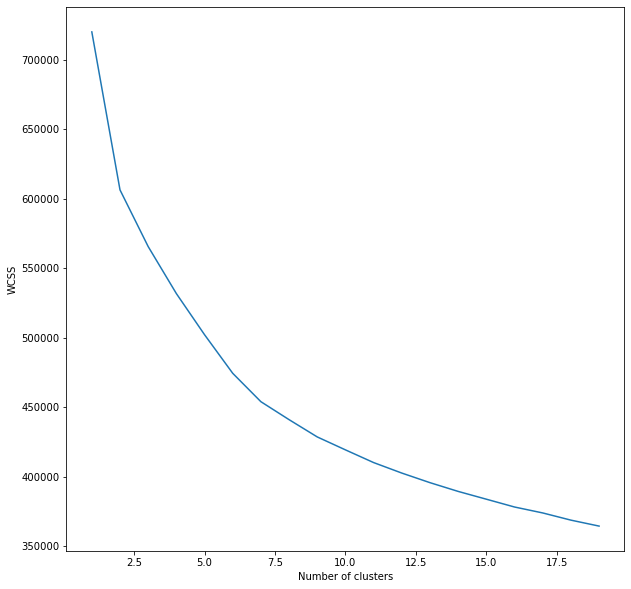

In [56]:
# finding optimal cluster amount
wcss = []
for i in range(1,20):
   model = KMeans(n_clusters = i, init = "k-means++", random_state=50)
   model.fit(cluster_df_scaled)
   wcss.append(model.inertia_)
plt.figure(figsize=(10,10))
plt.plot(range(1,20), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

##### WCSS summary
Based on the WCSS curve, we see the it stars to shallow around 7.5.  To ensure that we do not over fit our clustering models we will use 8 as the clusters for our PCA components.  Any more may impact the models performance.

##### PCA used to reduce dimensionality
Utilizing PCA, we selected 2 PCA components to allow for easier interpretation and visualization of the clusters.

In [57]:
# reducing dimensionality to 
pca = PCA(2)
data = pca.fit_transform(cluster_df_scaled)
data

array([[-3.00038239,  0.03429209],
       [ 1.28758274,  0.67173942],
       [-3.75468902, -2.1021996 ],
       ...,
       [ 0.38856668, -0.77255988],
       [-3.07343498, -2.18364036],
       [-1.20259237,  2.88897045]])

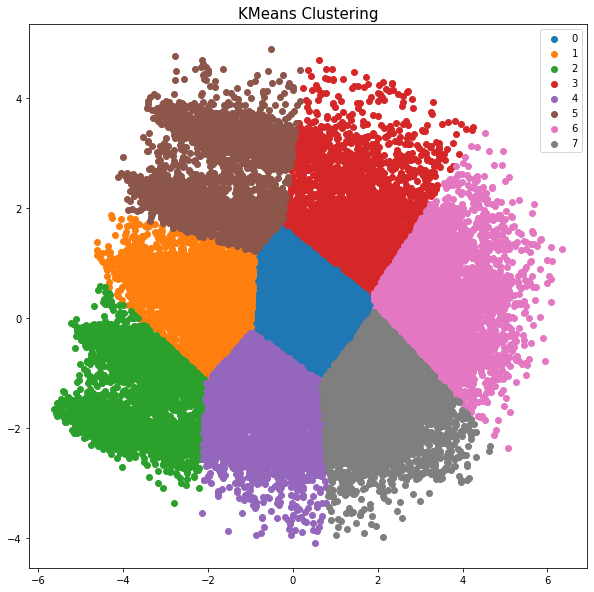

In [59]:
# clustering with PCA components

model = KMeans(n_clusters = 8, init = "k-means++")
label = model.fit_predict(data)


plt.figure(figsize=(10,10))
uniq = np.unique(label)
for i in uniq:
   plt.scatter(data[label == i , 0] , data[label == i , 1] , label = i)


plt.legend()
plt.title('KMeans Clustering', fontsize=15)
plt.show()

In [60]:
metrics.silhouette_score(cluster_df_scaled, label)

0.05121398932650241

#### Intepretation of Silhouette score of KNN Clustering
We use the Silhouette score to measure how dense and well-separated the clusters are for our data set.
The silhouette score of 1 means that the clusters are very dense and nicely separated. The score of 0 means that clusters are overlapping. The score of less than 0 means that data belonging to clusters may be wrong/incorrect.
In this instance we have a Silhouette score 0.05121.  Since its not negative and the visual show distinct clustering we fill that our PCA scaled cluster is adequate.

### DBSCAN Clustering

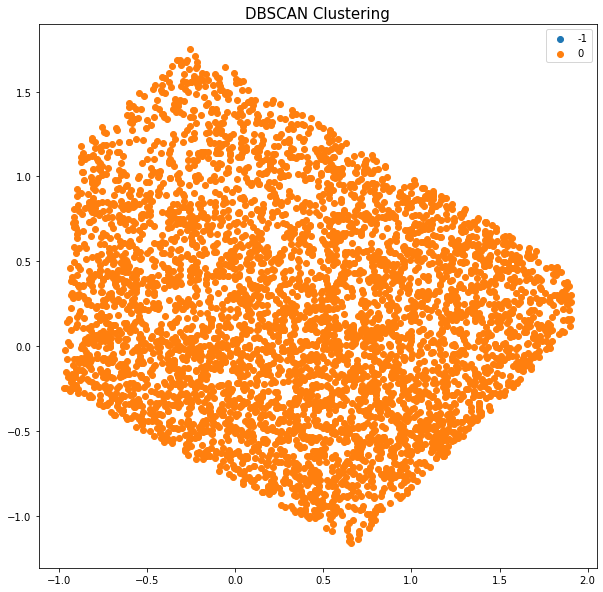

In [61]:
# DBScan Clustering with PCA

dbscan = DBSCAN(eps=0.3)
dbscan_label = dbscan.fit_predict(data)

plt.figure(figsize=(10,10))
uniq = np.unique(dbscan_label)
for i in uniq:
   plt.scatter(data[label == i , 0] , data[label == i , 1] , label = i)


plt.legend()
plt.title('DBSCAN Clustering', fontsize=15)
plt.show()

In [45]:
metrics.silhouette_score(cluster_df_scaled, dbscan_label)

0.16393519731744166

#### Intepretation of Silhouette score of DBScan Clustering
In the Dbscan instance we have a Silhouette score 0.1639.  However we did not observe dense clustering and this method will not be selected.

#### Hierarchical Agglomerative Clustering (HAC) Clustering

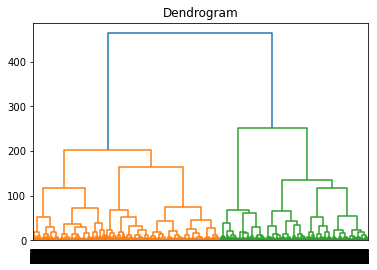

In [62]:
# utilizing a dendrogram to find the optimal number of clusters

dendrogram = sch.dendrogram(sch.linkage(data, method='ward'))
plt.title('Dendrogram')
plt.show()

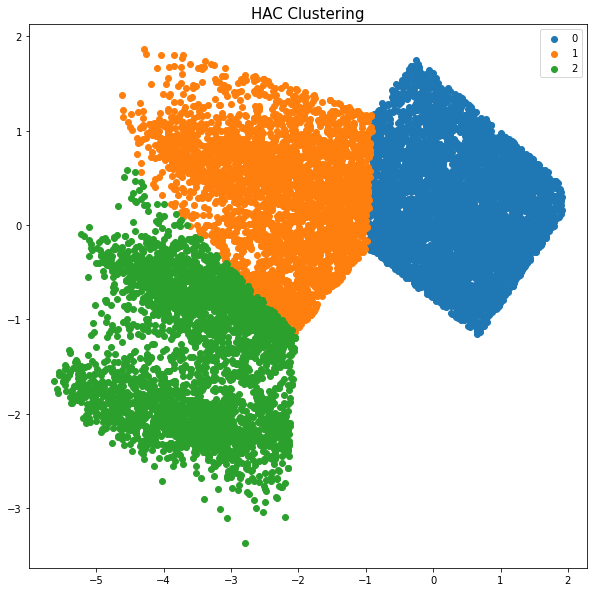

In [63]:
hac = AgglomerativeClustering(n_clusters=3, affinity='euclidean',linkage='ward')
hac_label = hac.fit_predict(data)

plt.figure(figsize=(10,10))
uniq = np.unique(hac_label)
for i in uniq:
    plt.scatter(data[label == i , 0] , data[label == i , 1] , label = i)


plt.legend()
plt.title('HAC Clustering', fontsize=15)
plt.show()

In [64]:
metrics.silhouette_score(cluster_df_scaled, hac_label)

0.09700137457204383

#### Intepretation of Silhouette score of HAC Clustering
In the HAC instance we have a Silhouette score 0.1639.  However we did not observe dense clustering and this method will not be selected.

In [66]:
result_df = dfclean.copy()
result_df['kmeans_cluster'] = label
result_df['dbscan_cluster'] = dbscan_label
result_df['hac_cluster'] = hac_label
result_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 67025 to 59701
Data columns (total 37 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   Gender                             30000 non-null  object  
 1   Customer Type                      30000 non-null  object  
 2   Age                                30000 non-null  int64   
 3   Type of Travel                     30000 non-null  object  
 4   Class                              30000 non-null  object  
 5   Flight Distance                    30000 non-null  int64   
 6   Inflight wifi service              30000 non-null  int64   
 7   Departure/Arrival time convenient  30000 non-null  int64   
 8   Ease of Online booking             30000 non-null  int64   
 9   Gate location                      30000 non-null  int64   
 10  Food and drink                     30000 non-null  int64   
 11  Online boarding                    30

Text(0.5, 1.0, 'HAC')

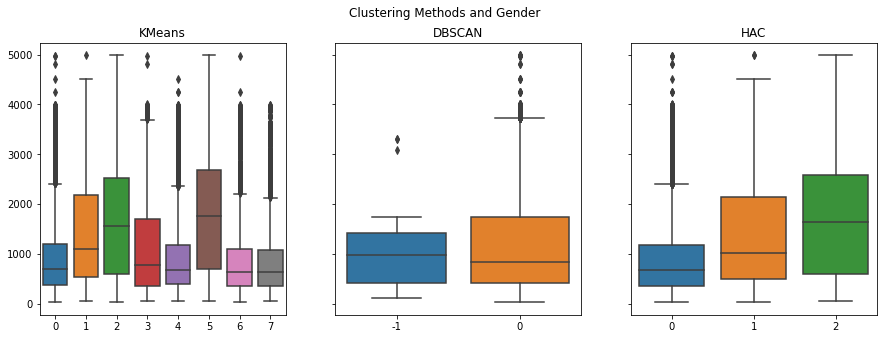

In [72]:
# clusters compared to Gender
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
fig.suptitle('Clustering Methods and Gender')

# Kmeans
sns.boxplot(ax=axes[0], x=result_df['kmeans_cluster'].values, y=result_df['Flight Distance'].values)
axes[0].set_title('KMeans')

# DBSCAN
sns.boxplot(ax=axes[1], x=result_df['dbscan_cluster'].values, y=result_df['Flight Distance'].values)
axes[1].set_title('DBSCAN')

# HAC
sns.boxplot(ax=axes[2], x=result_df['hac_cluster'].values, y=result_df['Flight Distance'].values)
axes[2].set_title('HAC')


Text(0.5, 1.0, 'HAC')

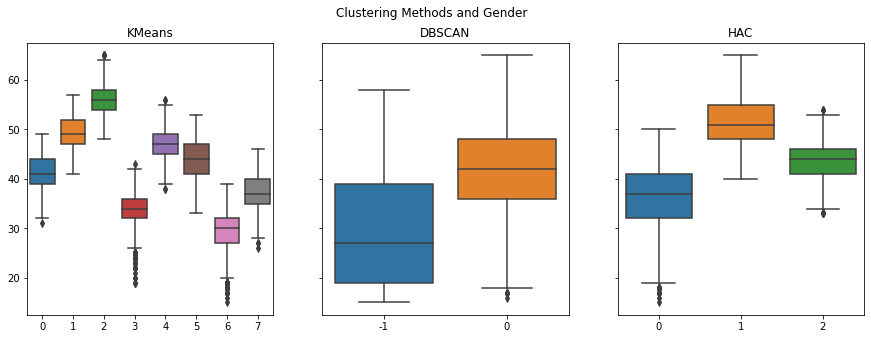

In [69]:
# clusters compared to Survey Total
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
fig.suptitle('Clustering Methods and Gender')

# Kmeans
sns.boxplot(ax=axes[0], x=result_df['kmeans_cluster'].values, y=result_df['Survey_Total'].values)
axes[0].set_title('KMeans')

# DBSCAN
sns.boxplot(ax=axes[1], x=result_df['dbscan_cluster'].values, y=result_df['Survey_Total'].values)
axes[1].set_title('DBSCAN')

# HAC
sns.boxplot(ax=axes[2], x=result_df['hac_cluster'].values, y=result_df['Survey_Total'].values)
axes[2].set_title('HAC')


### ACTION REQUIRED
Need to add intrepretation 

### Deployment (10 points total)
- Be critical of your performance and tell the reader how you current model might be usable by
other parties. Did you achieve your goals? If not, can you reign in the utility of your modeling?
- How useful is your model for interested parties (i.e., the companies or organizations
that might want to use it)?
- How would your deploy your model for interested parties?
- What other data should be collected?
- How often would the model need to be updated, etc.?

#### Deployment Summary
All models proved effective at creating clearly defined groups that customers could then extropolate back to the original data to find unclear relationships between the features of interest, which was our goal

This type of model is useful because we are able to take a data driven approach to generate behavioral benchmarks to how one responds to their satisfaction to the airline.  We identified this in our model and this model has the ability to identify actual dissatisfaction or potential anomalies.

Deployment of this method can be done be sharing this code to interested airline companies.  We will be required to refactor the data on the company's record.  In addition, we can provide airline companies to incorporate survey requirements to ensure that the model captures the relevant needs to the model

Other additional data that we may think will impact the data set
	• Age of aircraft or last remodel - Functionality on the aircraft in today's environment may impact customer view of the airline.
	• Weather condition during the flight - Depending on the conditions of the flight, we may have encountered turbulent weather that is out of the airlines control that we could identify as anomalies that may have skewed the customer satisfaction

The cadence of these reports should coincide to quarterly financial reports as this can be utilized to assess and course correct any issues to the financial plan as low customer satisfaction impacts both top and bottom line of the P&L.

### Exceptional Work (10 points total)
You have free reign to provide additional analyses or combine analyses

In [ ]:
#Exception work above.